In [ ]:
from IPython.display import clear_output
!pip install segmentation_models
clear_output()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2

os.environ["SM_FRAMEWORK"] = "tf.keras"
from tensorflow import keras
import segmentation_models as sm
import tensorflow as tf

Segmentation Models: using `tf.keras` framework.


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#!pip install pyunpack
#!pip install patool
#clear_output()
#from pyunpack import Archive
#Archive('/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/Combined_Data_Processed.rar').extractall('/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/')
#Archive('/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/Coronary_Angiography_Processed.rar').extractall('/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/')
#Archive('/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/Dilated_Fundus_Processed.rar').extractall('/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/')

In [ ]:
# Create a shorcut of the Images folder from the shared folder to your own drive
img_folder_path= "/content/gdrive/MyDrive/IMT/ProCom/Images"

In [ ]:
train_imgs_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/Combined_Data_Processed/Original/"
train_imgs_gt_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/Combined_Data_Processed/Ground_truth/"

train_imgs_list= os.listdir(train_imgs_path)
train_imgs_gt_list= os.listdir(train_imgs_gt_path)
train_imgs_gt_list_clean= [i.replace('_gt', '') for i in train_imgs_gt_list]

train_imgs_list= np.array(train_imgs_list)
train_imgs_gt_list= np.array(train_imgs_gt_list)
sorted_train_imgs_list= train_imgs_list[np.argsort(train_imgs_list)]
sorted_train_imgs_gt_list= train_imgs_gt_list[np.argsort(train_imgs_gt_list_clean)]

train_df= pd.DataFrame({'img': sorted_train_imgs_list, 'gt': sorted_train_imgs_gt_list})

train_df['img_fp']= train_imgs_path+'/'+train_df['img']
train_df['gt_fp']= train_imgs_gt_path+'/'+train_df['gt']

In [ ]:
train_df

,img,gt,img_fp,gt_fp
0,hflip_in_1.png,hflip_in_1_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
1,hflip_in_10.png,hflip_in_10_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
2,hflip_in_100.png,hflip_in_100_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
3,hflip_in_101.png,hflip_in_101_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
4,hflip_in_102.png,hflip_in_102_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
...,...,...,...,...
7467,vflip_tr_96_A.png,vflip_tr_96_A.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
7468,vflip_tr_97_A.png,vflip_tr_97_A.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
7469,vflip_tr_98_A.png,vflip_tr_98_A.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
7470,vflip_tr_99_A.png,vflip_tr_99_A.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...


In [ ]:
from sklearn.model_selection import train_test_split
train_df, loo_df= train_test_split(train_df, test_size=0.1, shuffle= True, random_state= 43)
train_index= train_df.index.values
val_index= loo_df.index.values
train_df= train_df.reset_index(drop=True)
loo_df= loo_df.reset_index(drop=True)

#loo_df.to_csv('/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/Combined_Data_Processed/loo_df.csv', index=False)

In [ ]:
from sklearn.model_selection import train_test_split
train_df, test_df= train_test_split(train_df, test_size=0.25, shuffle= True, random_state= 43)
train_index= train_df.index.values
val_index= test_df.index.values
train_df= train_df.reset_index(drop=True)
test_df= test_df.reset_index(drop=True)

In [ ]:
train_df

,img,gt,img_fp,gt_fp
0,vflip_te_16_A.png,vflip_te_16_A.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
1,in_40.png,in_40_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
2,hflip_in_117.png,hflip_in_117_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
3,hvflip_te_172_N.png,hvflip_te_172_N.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
4,rotate_90_tr_227_D.png,rotate_90_tr_227_D.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
...,...,...,...,...
5038,rotate_90_vflip_tr_570_N.png,rotate_90_vflip_tr_570_N.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
5039,rotate_90_in_45.png,rotate_90_in_45_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
5040,hvflip_tr_443_G.png,hvflip_tr_443_G.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
5041,rotate_90_vflip_tr_358_G.png,rotate_90_vflip_tr_358_G.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
import cv2

class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, dataframe, batch_size=32, shuffle=True, resolution= 256, img_dir= None, tg_dir= None):
        self.datagen = ImageDataGenerator(
            rescale=1./255,
            #rotation_range=20,
            #width_shift_range=0.2,
            #height_shift_range=0.2,
            #shear_range=0.2,
            #zoom_range=0.2,
            #horizontal_flip=True,
            #vertical_flip=True,
            #fill_mode='reflect',
            )
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.dataframe = dataframe
        self.resolution= resolution
        self.img_gen = self.datagen.flow_from_dataframe(
            dataframe= dataframe,
            directory= img_dir,
            x_col= 'img',
            seed= 42,
            class_mode= None,
            batch_size= batch_size,
            shuffle= False,
            target_size= (resolution, resolution),
            color_mode= 'grayscale')
        self.tg_gen = self.datagen.flow_from_dataframe(
            dataframe= dataframe,
            directory= tg_dir,
            x_col= 'gt',
            seed= 42,
            class_mode= None,
            batch_size= batch_size,
            shuffle= False,
            target_size= (resolution, resolution),
            color_mode= 'grayscale',
            interpolation='nearest')

    def __len__(self):
        #return len(self.generator)
        #return (len(self.dataframe)-1) // self.batch_size
        return int(self.img_gen.samples / self.batch_size)

    def on_epoch_end(self):
        #self.generator.on_epoch_end()
        self.dataframe = self.dataframe.sample(frac=1).reset_index(drop=True)

    def __getitem__(self, index):
        #return self.generator[idx]

        X = self.img_gen[index]
        y = self.tg_gen[index].round()


        return X, y

In [ ]:
batch_size= 8

custom_gen_train= CustomDataGenerator(train_df, batch_size= batch_size, resolution=256, img_dir= train_imgs_path, tg_dir= train_imgs_gt_path)
custom_gen_test= CustomDataGenerator(test_df, batch_size= batch_size, resolution=256, img_dir= train_imgs_path, tg_dir= train_imgs_gt_path)

Found 5043 validated image filenames.
Found 5043 validated image filenames.
Found 1681 validated image filenames.
Found 1681 validated image filenames.


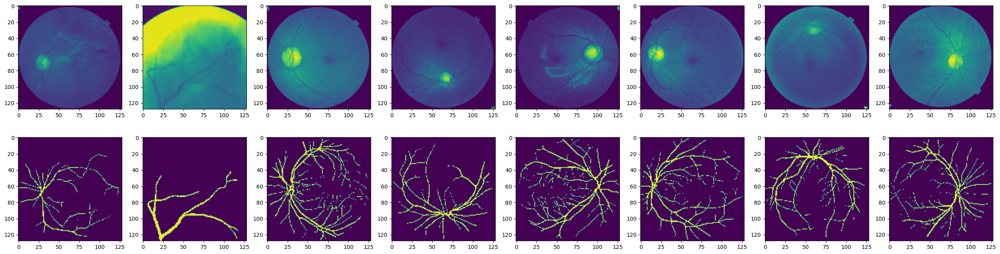

In [ ]:
sample_img, sample_tg= custom_gen_train.__getitem__(12)

fig, ax= plt.subplots(2, batch_size, figsize=(batch_size*4, 8))
for i in range(batch_size):
    ax[0,i].imshow(sample_img[i])
    ax[1,i].imshow(sample_tg[i])

In [13]:
from keras.callbacks import ModelCheckpoint

BACKBONE = 'efficientnetb3'
preprocess_input = sm.get_preprocessing(BACKBONE)

# define model
#model = sm.Unet(BACKBONE, classes=1, encoder_weights='imagenet',  activation='sigmoid')
model = sm.Unet(BACKBONE, classes=1,  activation='sigmoid', input_shape=(None, None, 1), encoder_weights=None)

total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss
metrics = [sm.metrics.IOUScore(), sm.metrics.FScore()]

# compile keras model with defined optimozer, loss and metrics
model.compile('Adam', total_loss, metrics)

#model.compile('Adam', loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])
model_save_path= "/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Combined_Data_Processed_Best_model.h5"
checkpoint = ModelCheckpoint(model_save_path, save_best_only=True, monitor="val_loss", mode="min", verbose=1)

history = model.fit(custom_gen_train,
                    validation_data= custom_gen_test,
                    epochs=25,
                    validation_steps= len(custom_gen_test),
                    steps_per_epoch= len(custom_gen_train),
                    callbacks=[checkpoint])

Epoch 1/25
630/630 [==============================] - ETA: 0s - loss: 0.4872 - iou_score: 0.4000 - f1-score: 0.5585
Epoch 1: val_loss improved from inf to 0.50183, saving model to /content/gdrive/MyDrive/IMT/ProCom/Code/Models/Combined_Data_Processed_Best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


630/630 [==============================] - 4459s 7s/step - loss: 0.4872 - iou_score: 0.4000 - f1-score: 0.5585 - val_loss: 0.5018 - val_iou_score: 0.3863 - val_f1-score: 0.5559
Epoch 2/25
630/630 [==============================] - ETA: 0s - loss: 0.3185 - iou_score: 0.5651 - f1-score: 0.7215
Epoch 2: val_loss improved from 0.50183 to 0.33680, saving model to /content/gdrive/MyDrive/IMT/ProCom/Code/Models/Combined_Data_Processed_Best_model.h5
630/630 [==============================] - 113s 180ms/step - loss: 0.3185 - iou_score: 0.5651 - f1-score: 0.7215 - val_loss: 0.3368 - val_iou_score: 0.5542 - val_f1-score: 0.7121
Epoch 3/25
630/630 [==============================] - ETA: 0s - loss: 0.2813 - iou_score: 0.6075 - f1-score: 0.7554
Epoch 3: val_loss improved from 0.33680 to 0.28976, saving model to /content/gdrive/MyDrive/IMT/ProCom/Code/Models/Combined_Data_Processed_Best_model.h5
630/630 [==============================] - 113s 180ms/step - loss: 0.2813 - iou_score: 0.6075 - f1-score: 

1/1 [==============================] - 3s 3s/step


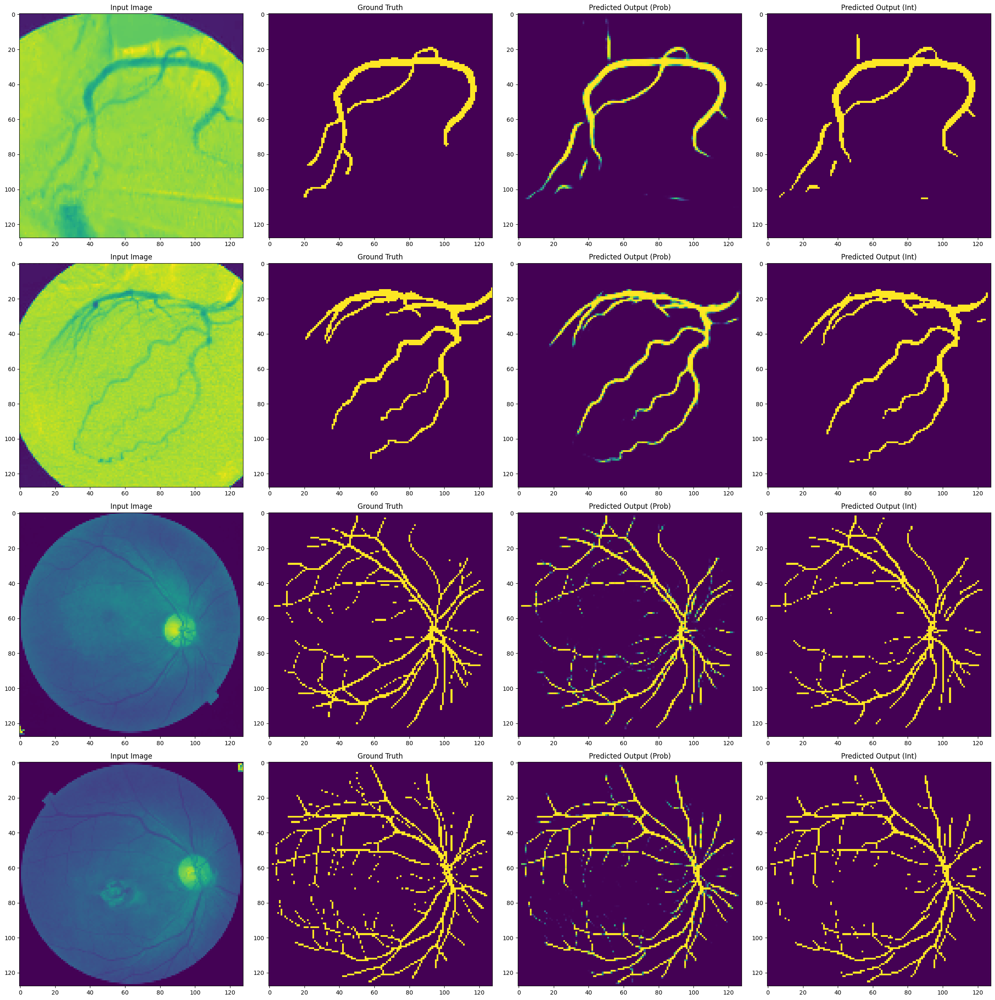

In [14]:
from keras.models import load_model
best_model = load_model("/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Combined_Data_Processed_Best_model.h5",
                        custom_objects={'binary_focal_loss_plus_dice_loss': total_loss, "iou_score": sm.metrics.IOUScore(), "f1-score": sm.metrics.FScore()})

test_id=3
# Get the predicted output for the test set
img_s= custom_gen_test[test_id]
y_pred = best_model.predict(img_s[0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(img_s[0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(img_s[1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

## Coronary_Angiography_Processed

In [ ]:
train_imgs_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/Coronary_Angiography_Processed/Original/"
train_imgs_gt_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/Coronary_Angiography_Processed/Ground_truth/"

train_imgs_list= os.listdir(train_imgs_path)
train_imgs_gt_list= os.listdir(train_imgs_gt_path)
train_imgs_gt_list_clean= [i.replace('_gt', '') for i in train_imgs_gt_list]

train_imgs_list= np.array(train_imgs_list)
train_imgs_gt_list= np.array(train_imgs_gt_list)
sorted_train_imgs_list= train_imgs_list[np.argsort(train_imgs_list)]
sorted_train_imgs_gt_list= train_imgs_gt_list[np.argsort(train_imgs_gt_list_clean)]

train_df= pd.DataFrame({'img': sorted_train_imgs_list, 'gt': sorted_train_imgs_gt_list})

train_df['img_fp']= train_imgs_path+'/'+train_df['img']
train_df['gt_fp']= train_imgs_gt_path+'/'+train_df['gt']

In [ ]:
train_df

,img,gt,img_fp,gt_fp
0,hflip_in_1.png,hflip_in_1_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
1,hflip_in_10.png,hflip_in_10_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
2,hflip_in_100.png,hflip_in_100_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
3,hflip_in_101.png,hflip_in_101_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
4,hflip_in_102.png,hflip_in_102_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
...,...,...,...,...
1067,vflip_in_95.png,vflip_in_95_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
1068,vflip_in_96.png,vflip_in_96_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
1069,vflip_in_97.png,vflip_in_97_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
1070,vflip_in_98.png,vflip_in_98_gt.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...


In [ ]:
# iterate over loo_df if an item is in train_df then add it to loo_df_cor otherwise add it to train_df_cor
loo_df_cor= pd.DataFrame(columns=['img', 'gt', 'img_fp', 'gt_fp'])
train_df_cor= pd.DataFrame(columns=['img', 'gt', 'img_fp', 'gt_fp'])
for i in range(len(train_df)):
    if train_df.iloc[i]['img'] in loo_df['img'].values:
        loo_df_cor= loo_df_cor.append(train_df.iloc[i], ignore_index=True)
    else:
        train_df_cor= train_df_cor.append(train_df.iloc[i], ignore_index=True)

<ipython-input-32-91d13f969fb6>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df_cor= train_df_cor.append(train_df.iloc[i], ignore_index=True)
<ipython-input-32-91d13f969fb6>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  loo_df_cor= loo_df_cor.append(train_df.iloc[i], ignore_index=True)


In [ ]:
from sklearn.model_selection import train_test_split
train_df, test_df= train_test_split(train_df_cor, test_size=0.25, shuffle= True, random_state= 43)
train_index= train_df.index.values
val_index= test_df.index.values
train_df= train_df.reset_index(drop=True)
test_df= test_df.reset_index(drop=True)

In [ ]:
batch_size= 8

custom_gen_train= CustomDataGenerator(train_df, batch_size= batch_size, resolution=256, img_dir= train_imgs_path, tg_dir= train_imgs_gt_path)
custom_gen_test= CustomDataGenerator(test_df, batch_size= batch_size, resolution=256, img_dir= train_imgs_path, tg_dir= train_imgs_gt_path)

Found 738 validated image filenames.
Found 738 validated image filenames.
Found 246 validated image filenames.
Found 246 validated image filenames.


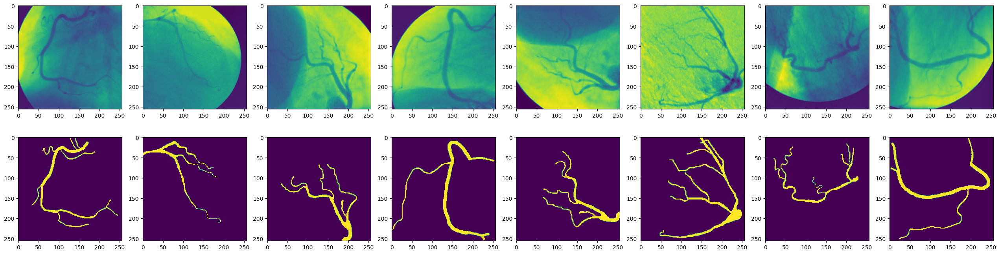

In [ ]:
sample_img, sample_tg= custom_gen_train.__getitem__(12)

fig, ax= plt.subplots(2, batch_size, figsize=(batch_size*4, 8))
for i in range(batch_size):
    ax[0,i].imshow(sample_img[i])
    ax[1,i].imshow(sample_tg[i])

In [ ]:
from keras.callbacks import ModelCheckpoint

BACKBONE = 'efficientnetb3'
preprocess_input = sm.get_preprocessing(BACKBONE)

# define model
#model = sm.Unet(BACKBONE, classes=1, encoder_weights='imagenet',  activation='sigmoid')
model = sm.Unet(BACKBONE, classes=1,  activation='sigmoid', input_shape=(None, None, 1), encoder_weights=None)

total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss
metrics = [sm.metrics.IOUScore(), sm.metrics.FScore()]

# compile keras model with defined optimozer, loss and metrics
model.compile('Adam', total_loss, metrics)

#model.compile('Adam', loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])
model_save_path= "/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Coronary_Angiography_Processed_Best_model.h5"
checkpoint = ModelCheckpoint(model_save_path, save_best_only=True, monitor="val_loss", mode="min", verbose=1)

history = model.fit(custom_gen_train,
                    validation_data= custom_gen_test,
                    epochs=25,
                    validation_steps= len(custom_gen_test),
                    steps_per_epoch= len(custom_gen_train),
                    callbacks=[checkpoint])

Epoch 1/25
92/92 [==============================] - ETA: 0s - loss: 0.6402 - iou_score: 0.2709 - f1-score: 0.4060
Epoch 1: val_loss improved from inf to 0.97049, saving model to /content/gdrive/MyDrive/IMT/ProCom/Code/Models/Coronary_Angiography_Processed_Best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


92/92 [==============================] - 110s 374ms/step - loss: 0.6402 - iou_score: 0.2709 - f1-score: 0.4060 - val_loss: 0.9705 - val_iou_score: 0.0323 - val_f1-score: 0.0625
Epoch 2/25
92/92 [==============================] - ETA: 0s - loss: 0.3489 - iou_score: 0.5228 - f1-score: 0.6859
Epoch 2: val_loss did not improve from 0.97049
92/92 [==============================] - 28s 299ms/step - loss: 0.3489 - iou_score: 0.5228 - f1-score: 0.6859 - val_loss: 1.0268 - val_iou_score: 0.0156 - val_f1-score: 0.0306
Epoch 3/25
92/92 [==============================] - ETA: 0s - loss: 0.3020 - iou_score: 0.5766 - f1-score: 0.7311
Epoch 3: val_loss did not improve from 0.97049
92/92 [==============================] - 28s 301ms/step - loss: 0.3020 - iou_score: 0.5766 - f1-score: 0.7311 - val_loss: 1.0921 - val_iou_score: 0.0035 - val_f1-score: 0.0069
Epoch 4/25
92/92 [==============================] - ETA: 0s - loss: 0.2828 - iou_score: 0.5995 - f1-score: 0.7494
Epoch 4: val_loss improved from 0.9

1/1 [==============================] - 2s 2s/step


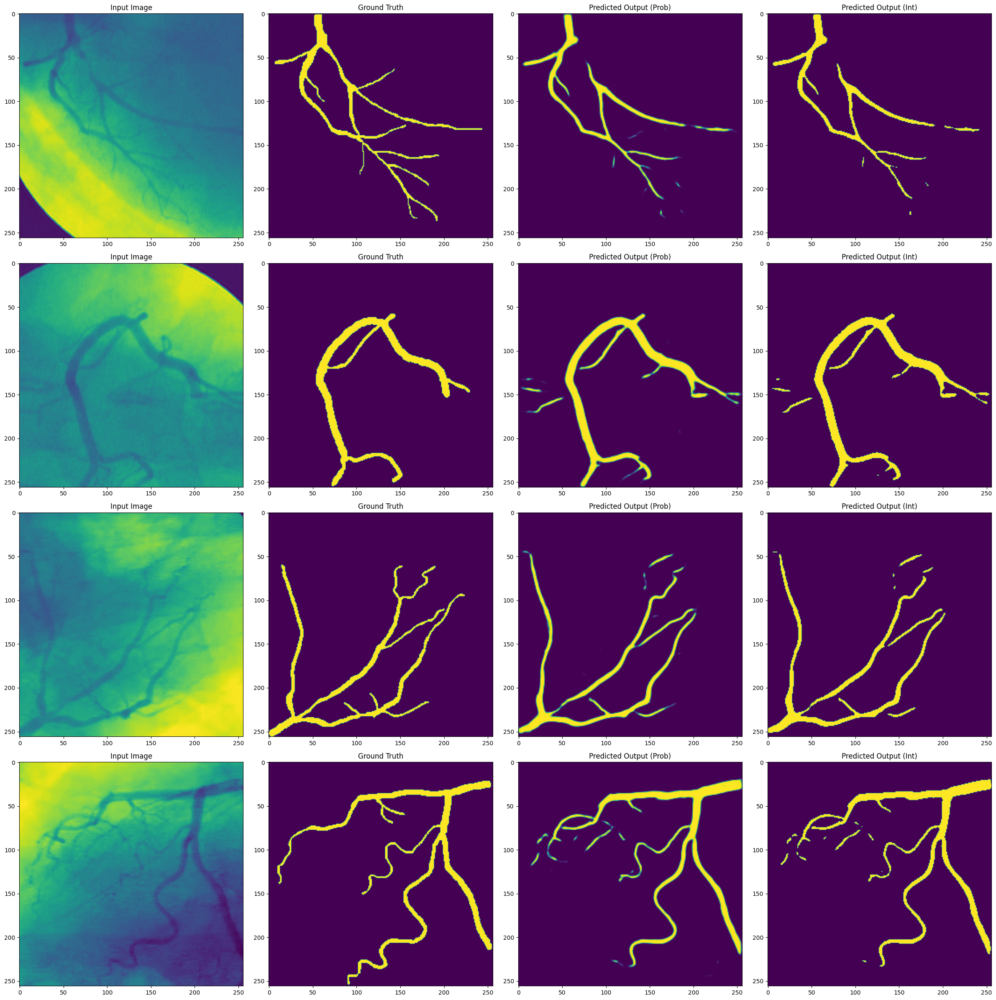

In [ ]:
from keras.models import load_model
best_model = load_model("/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Coronary_Angiography_Processed_Best_model.h5",
                        custom_objects={'binary_focal_loss_plus_dice_loss': total_loss, "iou_score": sm.metrics.IOUScore(), "f1-score": sm.metrics.FScore()})

test_id=3
# Get the predicted output for the test set
img_s= custom_gen_test[test_id]
y_pred = best_model.predict(img_s[0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(img_s[0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(img_s[1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

## Dilated_Fundus_Processed

In [ ]:
train_imgs_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/Dilated_Fundus_Processed/Original/"
train_imgs_gt_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/Processed_Data/Dilated_Fundus_Processed/Ground_truth/"

train_imgs_list= os.listdir(train_imgs_path)
train_imgs_gt_list= os.listdir(train_imgs_gt_path)
train_imgs_gt_list_clean= [i.replace('_gt', '') for i in train_imgs_gt_list]

train_imgs_list= np.array(train_imgs_list)
train_imgs_gt_list= np.array(train_imgs_gt_list)
sorted_train_imgs_list= train_imgs_list[np.argsort(train_imgs_list)]
sorted_train_imgs_gt_list= train_imgs_gt_list[np.argsort(train_imgs_gt_list_clean)]

train_df= pd.DataFrame({'img': sorted_train_imgs_list, 'gt': sorted_train_imgs_gt_list})

train_df['img_fp']= train_imgs_path+'/'+train_df['img']
train_df['gt_fp']= train_imgs_gt_path+'/'+train_df['gt']

In [ ]:
train_df

,img,gt,img_fp,gt_fp
0,hflip_te_100_D.png,hflip_te_100_D.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
1,hflip_te_101_G.png,hflip_te_101_G.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
2,hflip_te_102_G.png,hflip_te_102_G.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
3,hflip_te_103_G.png,hflip_te_103_G.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
4,hflip_te_104_G.png,hflip_te_104_G.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
...,...,...,...,...
6395,vflip_tr_96_A.png,vflip_tr_96_A.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
6396,vflip_tr_97_A.png,vflip_tr_97_A.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
6397,vflip_tr_98_A.png,vflip_tr_98_A.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...
6398,vflip_tr_99_A.png,vflip_tr_99_A.png,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...,/content/gdrive/MyDrive/IMT/ProCom/Images/Proc...


In [ ]:
# iterate over loo_df if an item is in train_df then add it to loo_df_dia otherwise add it to train_df_dia
loo_df_dia= pd.DataFrame(columns=['img', 'gt', 'img_fp', 'gt_fp'])
train_df_dia= pd.DataFrame(columns=['img', 'gt', 'img_fp', 'gt_fp'])
for i in range(len(train_df)):
    if train_df.iloc[i]['img'] in loo_df['img'].values:
        loo_df_dia= loo_df_dia.append(train_df.iloc[i], ignore_index=True)
    else:
        train_df_dia= train_df_dia.append(train_df.iloc[i], ignore_index=True)

<ipython-input-22-29b17995872b>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df_dia= train_df_dia.append(train_df.iloc[i], ignore_index=True)
<ipython-input-22-29b17995872b>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  loo_df_dia= loo_df_dia.append(train_df.iloc[i], ignore_index=True)


In [ ]:
from sklearn.model_selection import train_test_split
train_df, test_df= train_test_split(train_df_dia, test_size=0.25, shuffle= True, random_state= 43)
train_index= train_df.index.values
val_index= test_df.index.values
train_df= train_df.reset_index(drop=True)
test_df= test_df.reset_index(drop=True)

In [ ]:
batch_size= 8

custom_gen_train= CustomDataGenerator(train_df, batch_size= batch_size, resolution=256, img_dir= train_imgs_path, tg_dir= train_imgs_gt_path)
custom_gen_test= CustomDataGenerator(test_df, batch_size= batch_size, resolution=256, img_dir= train_imgs_path, tg_dir= train_imgs_gt_path)

Found 4305 validated image filenames.
Found 4305 validated image filenames.
Found 1435 validated image filenames.
Found 1435 validated image filenames.


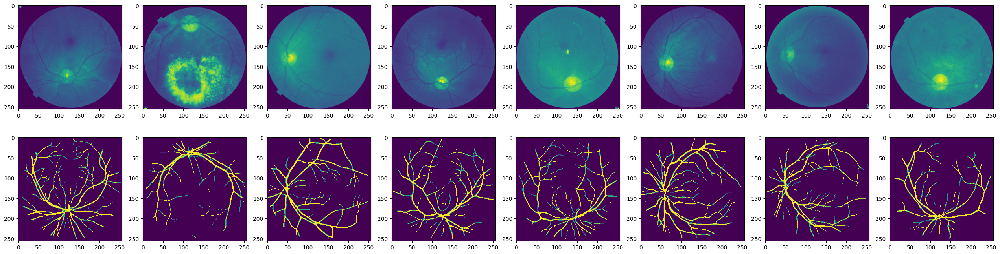

In [ ]:
sample_img, sample_tg= custom_gen_train.__getitem__(12)

fig, ax= plt.subplots(2, batch_size, figsize=(batch_size*4, 8))
for i in range(batch_size):
    ax[0,i].imshow(sample_img[i])
    ax[1,i].imshow(sample_tg[i])

In [ ]:
from keras.callbacks import ModelCheckpoint

BACKBONE = 'efficientnetb3'
preprocess_input = sm.get_preprocessing(BACKBONE)

# define model
#model = sm.Unet(BACKBONE, classes=1, encoder_weights='imagenet',  activation='sigmoid')
model = sm.Unet(BACKBONE, classes=1,  activation='sigmoid', input_shape=(None, None, 1), encoder_weights=None)

total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss
metrics = [sm.metrics.IOUScore(), sm.metrics.FScore()]

# compile keras model with defined optimozer, loss and metrics
model.compile('Adam', total_loss, metrics)

#model.compile('Adam', loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])
model_save_path= "/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Dilated_Fundus_Processed_Best_model.h5"
checkpoint = ModelCheckpoint(model_save_path, save_best_only=True, monitor="val_loss", mode="min", verbose=1)

history = model.fit(custom_gen_train,
                    validation_data= custom_gen_test,
                    epochs=25,
                    validation_steps= len(custom_gen_test),
                    steps_per_epoch= len(custom_gen_train),
                    callbacks=[checkpoint])

Epoch 1/25
538/538 [==============================] - ETA: 0s - loss: 0.3718 - iou_score: 0.5155 - f1-score: 0.6631
Epoch 1: val_loss improved from inf to 0.57793, saving model to /content/gdrive/MyDrive/IMT/ProCom/Code/Models/Dilated_Fundus_Processed_Best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


538/538 [==============================] - 3707s 7s/step - loss: 0.3718 - iou_score: 0.5155 - f1-score: 0.6631 - val_loss: 0.5779 - val_iou_score: 0.3802 - val_f1-score: 0.5499
Epoch 2/25
538/538 [==============================] - ETA: 0s - loss: 0.2052 - iou_score: 0.6972 - f1-score: 0.8212
Epoch 2: val_loss improved from 0.57793 to 0.19305, saving model to /content/gdrive/MyDrive/IMT/ProCom/Code/Models/Dilated_Fundus_Processed_Best_model.h5
538/538 [==============================] - 167s 311ms/step - loss: 0.2052 - iou_score: 0.6972 - f1-score: 0.8212 - val_loss: 0.1931 - val_iou_score: 0.7138 - val_f1-score: 0.8326
Epoch 3/25
538/538 [==============================] - ETA: 0s - loss: 0.1778 - iou_score: 0.7339 - f1-score: 0.8462
Epoch 3: val_loss improved from 0.19305 to 0.17809, saving model to /content/gdrive/MyDrive/IMT/ProCom/Code/Models/Dilated_Fundus_Processed_Best_model.h5
538/538 [==============================] - 171s 317ms/step - loss: 0.1778 - iou_score: 0.7339 - f1-score

In [ ]:
from keras.models import load_model
best_model = load_model("/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Dilated_Fundus_Processed_Best_model.h5",
                        custom_objects={'binary_focal_loss_plus_dice_loss': total_loss, "iou_score": sm.metrics.IOUScore(), "f1-score": sm.metrics.FScore()})

test_id=3
# Get the predicted output for the test set
img_s= custom_gen_test[test_id]
y_pred = best_model.predict(img_s[0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(img_s[0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(img_s[1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

Output hidden; open in https://colab.research.google.com to view.

## Draft

In [ ]:
from keras.callbacks import ModelCheckpoint

BACKBONE = 'efficientnetb3'
preprocess_input = sm.get_preprocessing(BACKBONE)

# define model
#model = sm.Unet(BACKBONE, classes=1, encoder_weights='imagenet',  activation='sigmoid')
model = sm.Unet(BACKBONE, classes=1,  activation='sigmoid', input_shape=(None, None, 1), encoder_weights=None)

total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss
metrics = [sm.metrics.IOUScore(), sm.metrics.FScore()]

# compile keras model with defined optimozer, loss and metrics
model.compile('Adam', total_loss, metrics)

#model.compile('Adam', loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])
model_save_path= "/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Combined_Data_Processed_Best_model.h5"
checkpoint = ModelCheckpoint(model_save_path, save_best_only=True, monitor="val_loss", mode="min", verbose=1)

history = model.fit(custom_gen_train,
                    validation_data= custom_gen_test,
                    epochs=100,
                    validation_steps= len(custom_gen_test),
                    steps_per_epoch= len(custom_gen_train),
                    callbacks=[checkpoint])

Epoch 1/100
87/87 [==============================] - ETA: 0s - loss: 0.8110 - iou_score: 0.1376 - f1-score: 0.2381
Epoch 1: val_loss improved from inf to 0.95658, saving model to /content/gdrive/MyDrive/IMT/ProCom/Code/Models/Combined_best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


87/87 [==============================] - 971s 10s/step - loss: 0.8110 - iou_score: 0.1376 - f1-score: 0.2381 - val_loss: 0.9566 - val_iou_score: 0.0415 - val_f1-score: 0.0796
Epoch 2/100
87/87 [==============================] - ETA: 0s - loss: 0.6035 - iou_score: 0.2909 - f1-score: 0.4491
Epoch 2: val_loss did not improve from 0.95658
87/87 [==============================] - 152s 2s/step - loss: 0.6035 - iou_score: 0.2909 - f1-score: 0.4491 - val_loss: 1.0752 - val_iou_score: 0.0065 - val_f1-score: 0.0130
Epoch 3/100
87/87 [==============================] - ETA: 0s - loss: 0.5280 - iou_score: 0.3575 - f1-score: 0.5260
Epoch 3: val_loss did not improve from 0.95658
87/87 [==============================] - 148s 2s/step - loss: 0.5280 - iou_score: 0.3575 - f1-score: 0.5260 - val_loss: 1.1121 - val_iou_score: 0.0022 - val_f1-score: 0.0043
Epoch 4/100
87/87 [==============================] - ETA: 0s - loss: 0.4840 - iou_score: 0.3975 - f1-score: 0.5683
Epoch 4: val_loss did not improve from

KeyboardInterrupt: ignored

1/1 [==============================] - 2s 2s/step


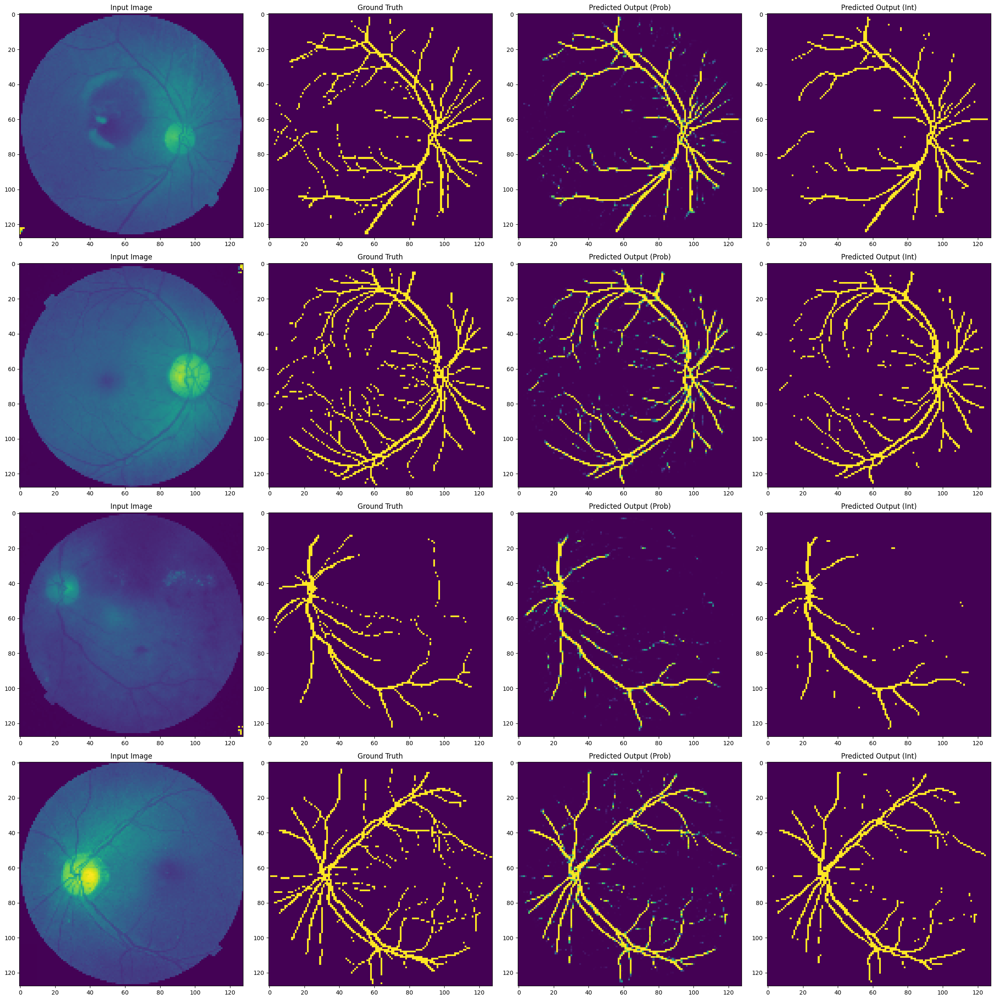

In [ ]:
from keras.models import load_model
best_model = load_model("/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Combined_best_model.h5",
                        custom_objects={'binary_focal_loss_plus_dice_loss': total_loss, "iou_score": sm.metrics.IOUScore(), "f1-score": sm.metrics.FScore()})

train_id=10
# Get the predicted output for the train set
img_s= custom_gen_train[train_id]
y_pred = best_model.predict(img_s[0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(img_s[0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(img_s[1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

1/1 [==============================] - 2s 2s/step


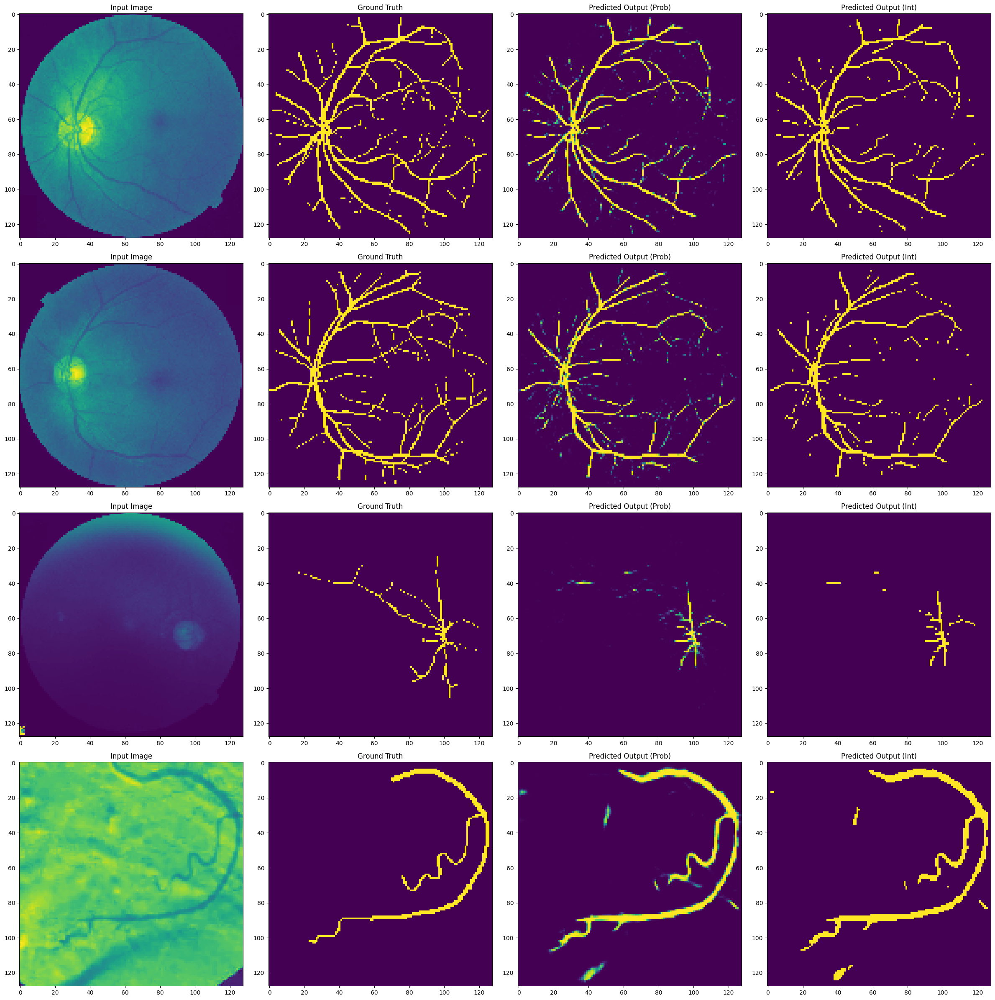

In [ ]:
from keras.models import load_model
best_model = load_model("/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Combined_best_model.h5",
                        custom_objects={'binary_focal_loss_plus_dice_loss': total_loss, "iou_score": sm.metrics.IOUScore(), "f1-score": sm.metrics.FScore()})

test_id=3
# Get the predicted output for the test set
img_s= custom_gen_test[test_id]
y_pred = best_model.predict(img_s[0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(img_s[0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(img_s[1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

1/1 [==============================] - 2s 2s/step


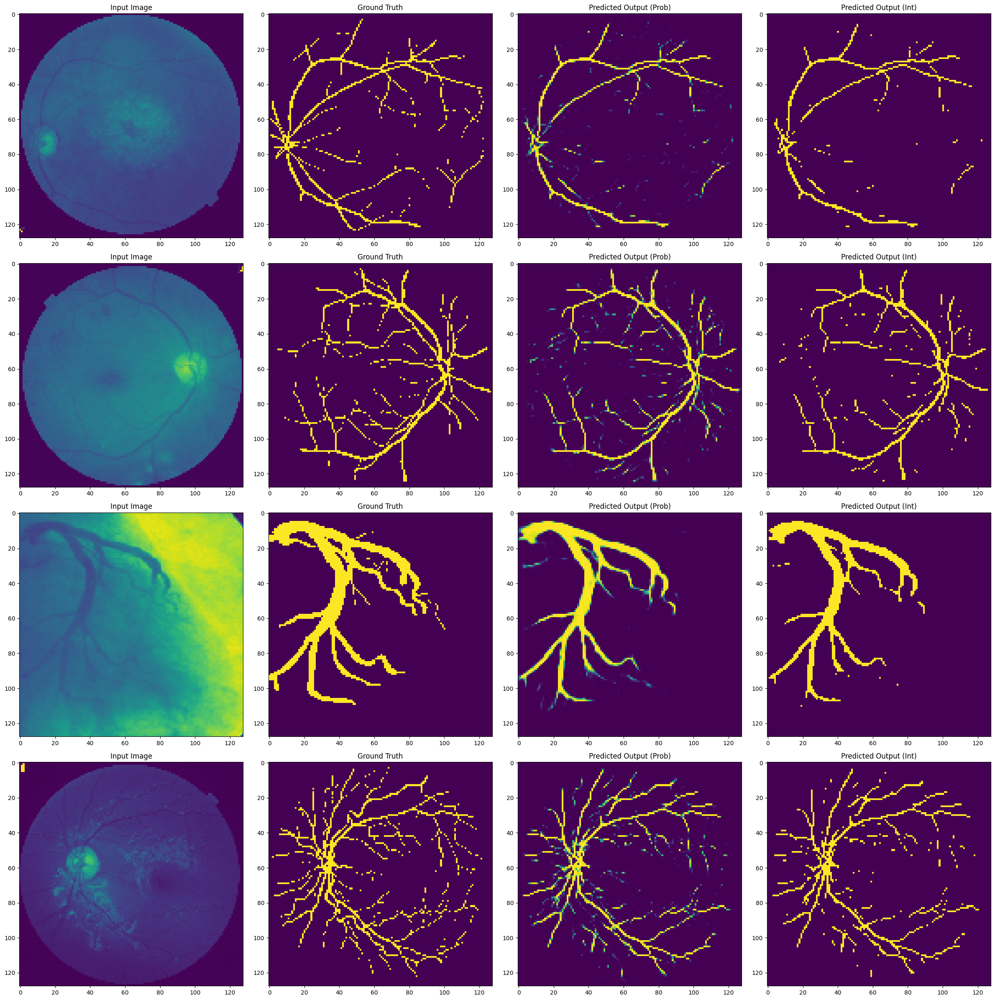

In [ ]:
from keras.models import load_model
best_model = load_model("/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Combined_best_model.h5",
                        custom_objects={'binary_focal_loss_plus_dice_loss': total_loss, "iou_score": sm.metrics.IOUScore(), "f1-score": sm.metrics.FScore()})

test_id=4
# Get the predicted output for the test set
img_s= custom_gen_test[test_id]
y_pred = best_model.predict(img_s[0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(img_s[0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(img_s[1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

1/1 [==============================] - 2s 2s/step


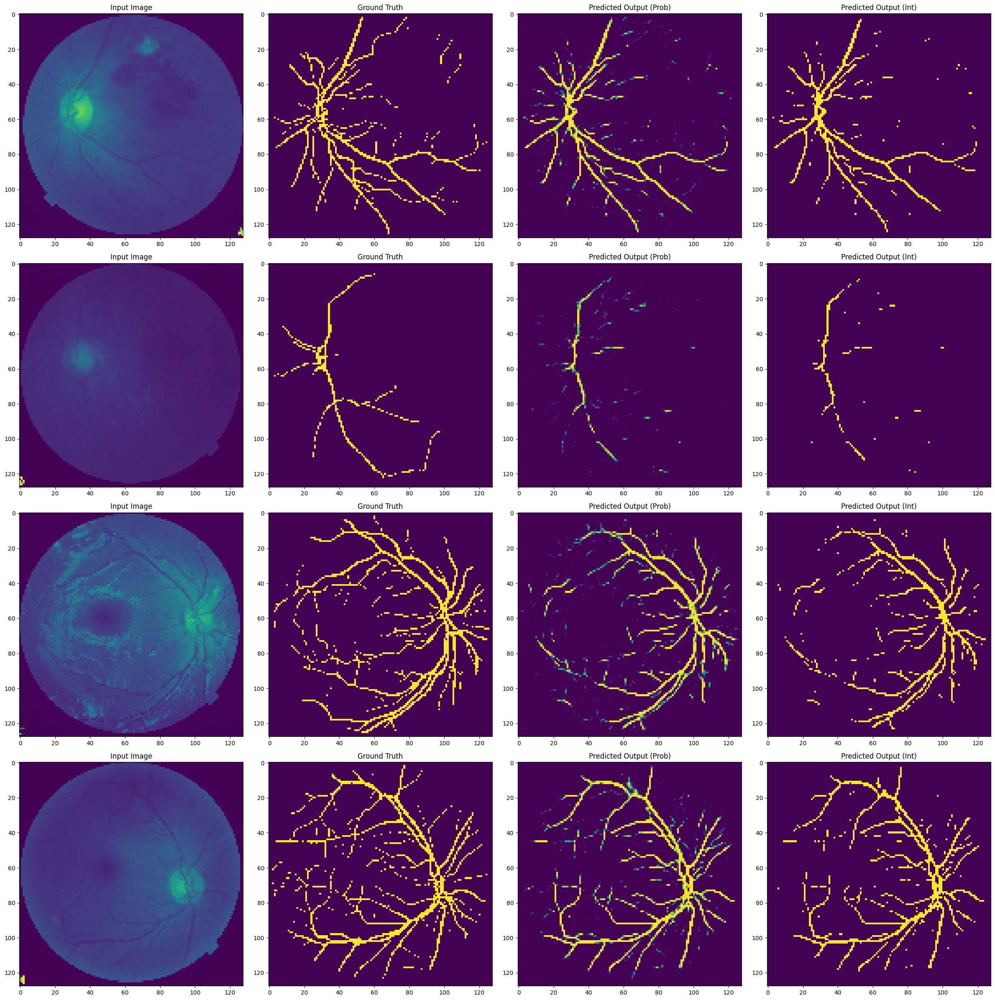

In [ ]:
from keras.models import load_model
best_model = load_model("/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Combined_best_model.h5",
                        custom_objects={'binary_focal_loss_plus_dice_loss': total_loss, "iou_score": sm.metrics.IOUScore(), "f1-score": sm.metrics.FScore()})

test_id=5
# Get the predicted output for the test set
img_s= custom_gen_test[test_id]
y_pred = best_model.predict(img_s[0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(img_s[0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(img_s[1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

# Draft

## Dataset images

In [ ]:
coro_list_path= f'{img_folder_path}/Database_134_Angiograms'
coro_list = os.listdir(coro_list_path)

coro_imgs_list= [i for i in coro_list if not "gt" in i]
coro_imgs_list.remove('code_to_open_images.ipynb')
coro_imgs_gt_list= [i for i in coro_list if "gt" in i]

coro_imgs_list_ids= [int(i.split('.')[0]) for i in coro_imgs_list]
coro_imgs_gt_list_ids= [int(i.split('_')[0]) for i in coro_imgs_gt_list]

coro_imgs_list = np.array(coro_imgs_list)[np.argsort(coro_imgs_list_ids)]
coro_imgs_gt_list = np.array(coro_imgs_gt_list)[np.argsort(coro_imgs_gt_list_ids)]


train_df_1= pd.DataFrame({'img': coro_imgs_list, 'gt': coro_imgs_gt_list})
train_df_1['img_fp']= coro_list_path+'/'+train_df_1['img']
train_df_1['gt_fp']= coro_list_path+'/'+train_df_1['gt']

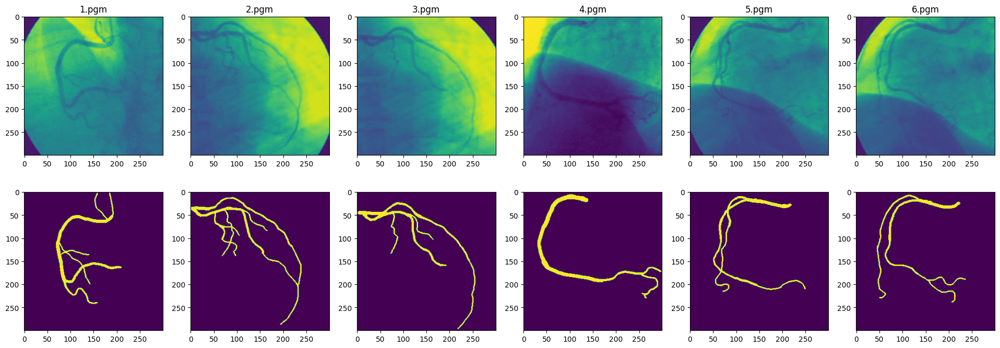

In [ ]:
fig, ax= plt.subplots(2,6, figsize=(24,8))
for j in range(6):
        ax[0, j].imshow(plt.imread(f'{img_folder_path}/Database_134_Angiograms/{coro_imgs_list[j]}'))
        ax[0, j].set_title(coro_imgs_list[j][-7:])
        ax[1, j].imshow(plt.imread(f'{img_folder_path}/Database_134_Angiograms/{coro_imgs_gt_list[j]}'))
        #ax[0 ,j].axis('off')

In [ ]:
imgs_export_path= f'{img_folder_path}/Coronary_Angiography_all/Original/'
gts_export_path= f'{img_folder_path}/Coronary_Angiography_all/Ground truth/'

imgs_counter= 0

for i in range(train_df_1.shape[0]):
  im= plt.imread(train_df_1.img_fp[i])
  gt= plt.imread(train_df_1.gt_fp[i])

  plt.imsave(f"{imgs_export_path}{imgs_counter}.png", im)
  plt.imsave(f"{gts_export_path}{imgs_counter}.png", gt)

  imgs_counter+=1

## Manually annotated images

In [ ]:
train_imgs_path= f'{img_folder_path}/Coronary_Angiography'
train_imgs_gt_path= f'{img_folder_path}/Coronary_Angiography_GT/Secondaires'

train_imgs_list = os.listdir(train_imgs_path)
train_imgs_gt_list= os.listdir(train_imgs_gt_path)
train_imgs_gt_list= [i for i in train_imgs_gt_list if "secondaires" in i]
train_imgs_gt_list_ids= [int(i[:3]) for i in train_imgs_gt_list]

train_imgs_list = [i for i in train_imgs_list if int(i[20:23]) in train_imgs_gt_list_ids]
train_imgs_list_ids= [int(i[20:23]) for i in train_imgs_list]

train_imgs_list = np.array(train_imgs_list)[np.argsort(train_imgs_list_ids)]
train_imgs_gt_list = np.array(train_imgs_gt_list)[np.argsort(train_imgs_gt_list_ids)]

train_df_2= pd.DataFrame({'img': train_imgs_list, 'gt': train_imgs_gt_list})
train_df_2['img_fp']= train_imgs_path+'/'+train_df_2['img']
train_df_2['gt_fp']= train_imgs_gt_path+'/'+train_df_2['gt']

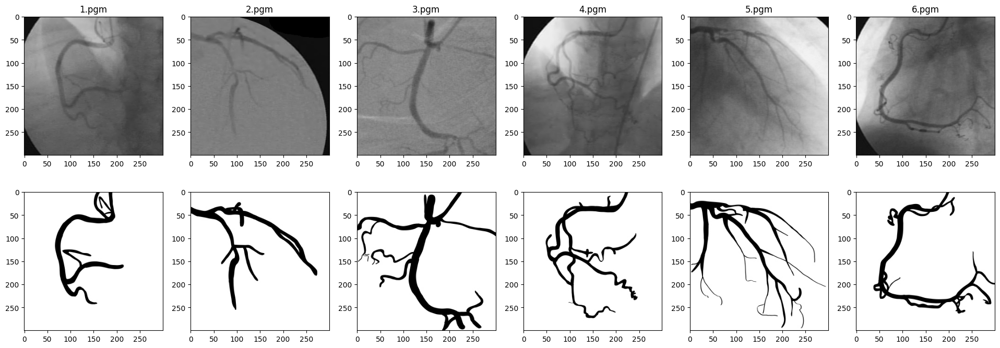

In [ ]:
fig, ax= plt.subplots(2,6, figsize=(24,8))
for j in range(6):
        ax[0, j].imshow(plt.imread(f'{img_folder_path}/Coronary_Angiography/{train_imgs_list[j]}'))
        ax[0, j].set_title(coro_imgs_list[j][-7:])
        ax[1, j].imshow(plt.imread(f'{img_folder_path}/Coronary_Angiography_GT/Secondaires/{train_imgs_gt_list[j]}'))
        #ax[0 ,j].axis('off')

In [ ]:
imgs_export_path= f'{img_folder_path}/Coronary_Angiography_all/Original/'
gts_export_path= f'{img_folder_path}/Coronary_Angiography_all/Ground truth/'

imgs_counter= train_df_1.shape[0]

for i in range(train_df_2.shape[0]):
  im= plt.imread(train_df_2.img_fp[i])
  gt= plt.imread(train_df_2.gt_fp[i])

  im= cv2.cvtColor(im[:,:,:3], cv2.COLOR_BGR2GRAY)
  gt= (gt.mean(axis=-1)<=128).astype(int)

  plt.imsave(f"{imgs_export_path}{imgs_counter}.png", im)
  plt.imsave(f"{gts_export_path}{imgs_counter}.png", gt)

  imgs_counter+=1

In [ ]:
train_df= pd.concat([train_df_1, train_df_2], axis=0)
train_df.reset_index(drop=True, inplace=True)

## Modeling

In [ ]:
train_imgs_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/Coronary_Angiography_all/Original/"
train_imgs_gt_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/Coronary_Angiography_all/Ground truth/"

train_imgs_list= os.listdir(train_imgs_path)
train_imgs_gt_list= os.listdir(train_imgs_gt_path)

train_imgs_list.sort()
train_imgs_gt_list.sort()

train_df= pd.DataFrame({'img': train_imgs_list, 'gt': train_imgs_gt_list})

train_df['img_fp']= train_imgs_path+'/'+train_df['img']
train_df['gt_fp']= train_imgs_gt_path+'/'+train_df['gt']

In [ ]:
from sklearn.model_selection import train_test_split
train_df, test_df= train_test_split(train_df, test_size=0.25, shuffle= True, random_state= 43)
train_index= train_df.index.values
val_index= test_df.index.values
train_df= train_df.reset_index(drop=True)
test_df= test_df.reset_index(drop=True)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
import cv2

class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, dataframe, batch_size=32, shuffle=True, augment=False, resolution= 256, img_dir= None, tg_dir= None, preprocessing=None, denoising=None):
        self.datagen = ImageDataGenerator(
            rescale=1./255,
            rotation_range=20,
            #width_shift_range=0.2,
            #height_shift_range=0.2,
            #shear_range=0.2,
            zoom_range=0.2,
            horizontal_flip=True,
            vertical_flip=True,
            fill_mode='reflect',
            )
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.dataframe = dataframe
        self.augment = augment
        self.resolution= resolution
        self.img_gen = self.datagen.flow_from_dataframe(
            dataframe= dataframe,
            directory= img_dir,
            x_col= 'img',
            seed= 42,
            class_mode= None,
            batch_size= batch_size,
            shuffle= False,
            target_size= (resolution, resolution),
            color_mode= 'grayscale')
        self.tg_gen = self.datagen.flow_from_dataframe(
            dataframe= dataframe,
            directory= tg_dir,
            x_col= 'gt',
            seed= 42,
            class_mode= None,
            batch_size= batch_size,
            shuffle= False,
            target_size= (resolution, resolution),
            color_mode= 'grayscale',
            interpolation='nearest')
        self.preprocessing = preprocessing
        self.denoising = denoising

    def __len__(self):
        #return len(self.generator)
        #return (len(self.dataframe)-1) // self.batch_size
        return int(self.img_gen.samples / self.batch_size)

    def on_epoch_end(self):
        #self.generator.on_epoch_end()
        self.dataframe = self.dataframe.sample(frac=1).reset_index(drop=True)

    def __getitem__(self, index):
        #return self.generator[idx]
        if self.denoising:
          X= []
          y= []
          for ba in range(self.batch_size):
              img_name=  self.dataframe['img_fp'][self.batch_size * index + ba]
              noisy_image = cv2.imread(img_name, cv2.IMREAD_COLOR)
              noisy_image= cv2.resize(noisy_image, (self.resolution, self.resolution))
              denoised_image = cv2.fastNlMeansDenoisingColored(noisy_image)
              denoised_image= cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB)
              #denoised_image= cv2.resize(denoised_image, (self.resolution, self.resolution))
              X.append(denoised_image)

              tg_name= self.dataframe['gt_fp'][self.batch_size * index + ba]
              tg= plt.imread(tg_name)
              tg= cv2.resize(tg, (self.resolution, self.resolution))
              tg= cv2.cvtColor(tg, cv2.COLOR_RGB2GRAY).round()
              y.append(tg)


          X= np.array(X, dtype=np.float32)
          X= np.divide(X, 255.)
          y= np.array(y, dtype=np.float32)
          y= y.reshape((self.batch_size, self.resolution, self.resolution, 1))

        else:
          X = self.img_gen[index]
          y = self.tg_gen[index].round()

          #if self.augment:
          #  X = self.datagen.random_transform(X.copy(), seed=7)
          #  y = self.datagen.random_transform(y.copy(), seed=7)

        if self.preprocessing:
            sample = self.preprocessing(image=X, mask=y)
            X, y = sample['image'], sample['mask']


        return X, y

In [ ]:
batch_size= 8

custom_gen_train= CustomDataGenerator(train_df, batch_size= batch_size, resolution=128, img_dir= train_imgs_path, tg_dir= train_imgs_gt_path, preprocessing=None, denoising=False, augment=True)
custom_gen_test= CustomDataGenerator(test_df, batch_size= batch_size, resolution=128, img_dir= train_imgs_path, tg_dir= train_imgs_gt_path, preprocessing=None, denoising=False, augment=True)

Found 139 validated image filenames.
Found 139 validated image filenames.
Found 47 validated image filenames.
Found 47 validated image filenames.


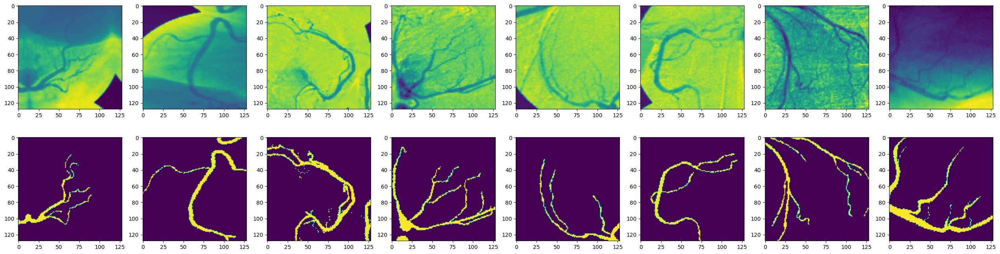

In [ ]:
# With slight augmentation
sample_img, sample_tg= custom_gen_train.__getitem__(12)

fig, ax= plt.subplots(2, batch_size, figsize=(batch_size*4, 8))
for i in range(batch_size):
    ax[0,i].imshow(sample_img[i])
    ax[1,i].imshow(sample_tg[i])

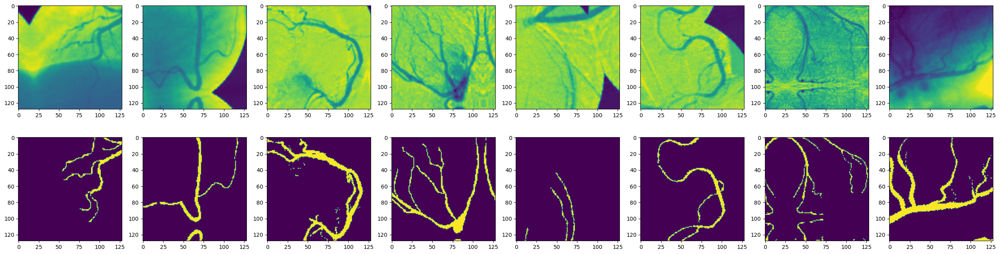

In [ ]:
# With augmentation
sample_img, sample_tg= custom_gen_train.__getitem__(12)

fig, ax= plt.subplots(2, batch_size, figsize=(batch_size*4, 8))
for i in range(batch_size):
    ax[0,i].imshow(sample_img[i])
    ax[1,i].imshow(sample_tg[i])

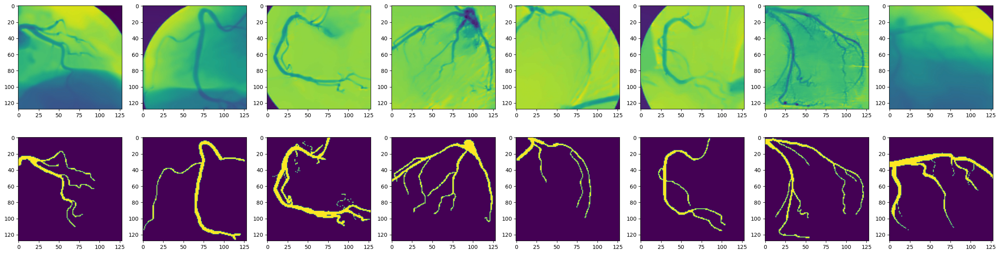

In [ ]:
# No augmentation
sample_img, sample_tg= custom_gen_train.__getitem__(12)

fig, ax= plt.subplots(2, batch_size, figsize=(batch_size*4, 8))
for i in range(batch_size):
    ax[0,i].imshow(sample_img[i])
    ax[1,i].imshow(sample_tg[i])

In [ ]:
from keras.callbacks import ModelCheckpoint

BACKBONE = 'efficientnetb3'
preprocess_input = sm.get_preprocessing(BACKBONE)

# define model
#model = sm.Unet(BACKBONE, classes=1, encoder_weights='imagenet',  activation='sigmoid')
model = sm.Unet(BACKBONE, classes=1,  activation='sigmoid', input_shape=(None, None, 1), encoder_weights=None)

total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss
metrics = [sm.metrics.IOUScore(), sm.metrics.FScore()]

# compile keras model with defined optimozer, loss and metrics
model.compile('Adam', total_loss, metrics)

#model.compile('Adam', loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])
model_save_path= "/content/gdrive/MyDrive/IMT/ProCom/Code/Models/Coronary_best_model.h5"
checkpoint = ModelCheckpoint(model_save_path, save_best_only=True, monitor="val_loss", mode="min", verbose=1)

history = model.fit(custom_gen_train,
                    validation_data= custom_gen_test,
                    epochs=100,
                    validation_steps= len(custom_gen_test),
                    steps_per_epoch= len(custom_gen_train),
                    callbacks=[checkpoint])

Epoch 1/100
17/17 [==============================] - ETA: 0s - loss: 1.0342 - iou_score: 0.0794 - f1-score: 0.1470
Epoch 1: val_loss improved from inf to 0.95348, saving model to /content/gdrive/MyDrive/IMT/ProCom/Code/Models/Coronary_best_model.h5
17/17 [==============================] - 75s 786ms/step - loss: 1.0342 - iou_score: 0.0794 - f1-score: 0.1470 - val_loss: 0.9535 - val_iou_score: 0.0514 - val_f1-score: 0.0976
Epoch 2/100
17/17 [==============================] - ETA: 0s - loss: 0.8576 - iou_score: 0.1127 - f1-score: 0.2023
Epoch 2: val_loss did not improve from 0.95348
17/17 [==============================] - 3s 172ms/step - loss: 0.8576 - iou_score: 0.1127 - f1-score: 0.2023 - val_loss: 0.9598 - val_iou_score: 0.0579 - val_f1-score: 0.1095
Epoch 3/100
17/17 [==============================] - ETA: 0s - loss: 0.7428 - iou_score: 0.1756 - f1-score: 0.2976
Epoch 3: val_loss improved from 0.95348 to 0.93680, saving model to /content/gdrive/MyDrive/IMT/ProCom/Code/Models/Coronary

1/1 [==============================] - 0s 75ms/step


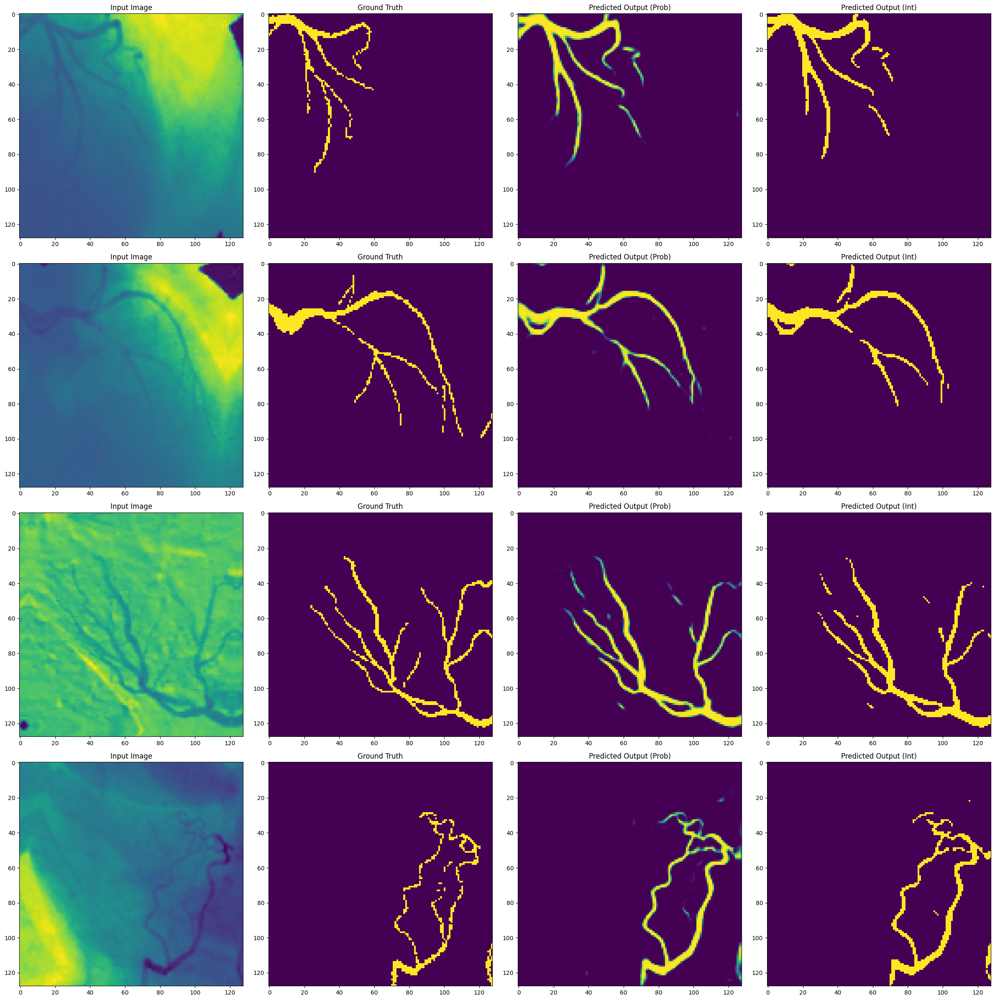

In [ ]:
# slight augmentation
train_id=10
# Get the predicted output for the train set
img_s= custom_gen_train[train_id]
y_pred = model.predict(img_s[0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(img_s[0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(img_s[1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

1/1 [==============================] - 0s 53ms/step


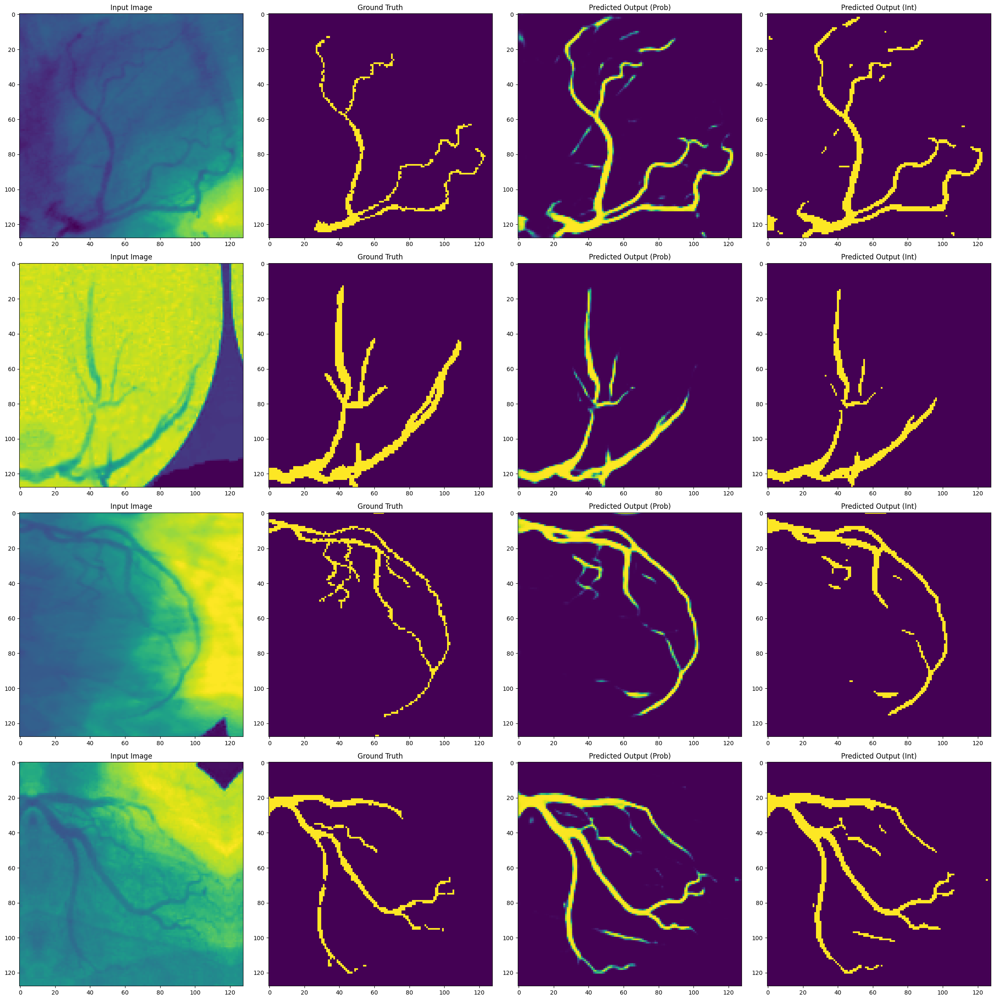

In [ ]:
# slight augmentation
test_id=3
# Get the predicted output for the test set
img_s= custom_gen_test[test_id]
y_pred = model.predict(img_s[0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(img_s[0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(img_s[1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

1/1 [==============================] - 3s 3s/step


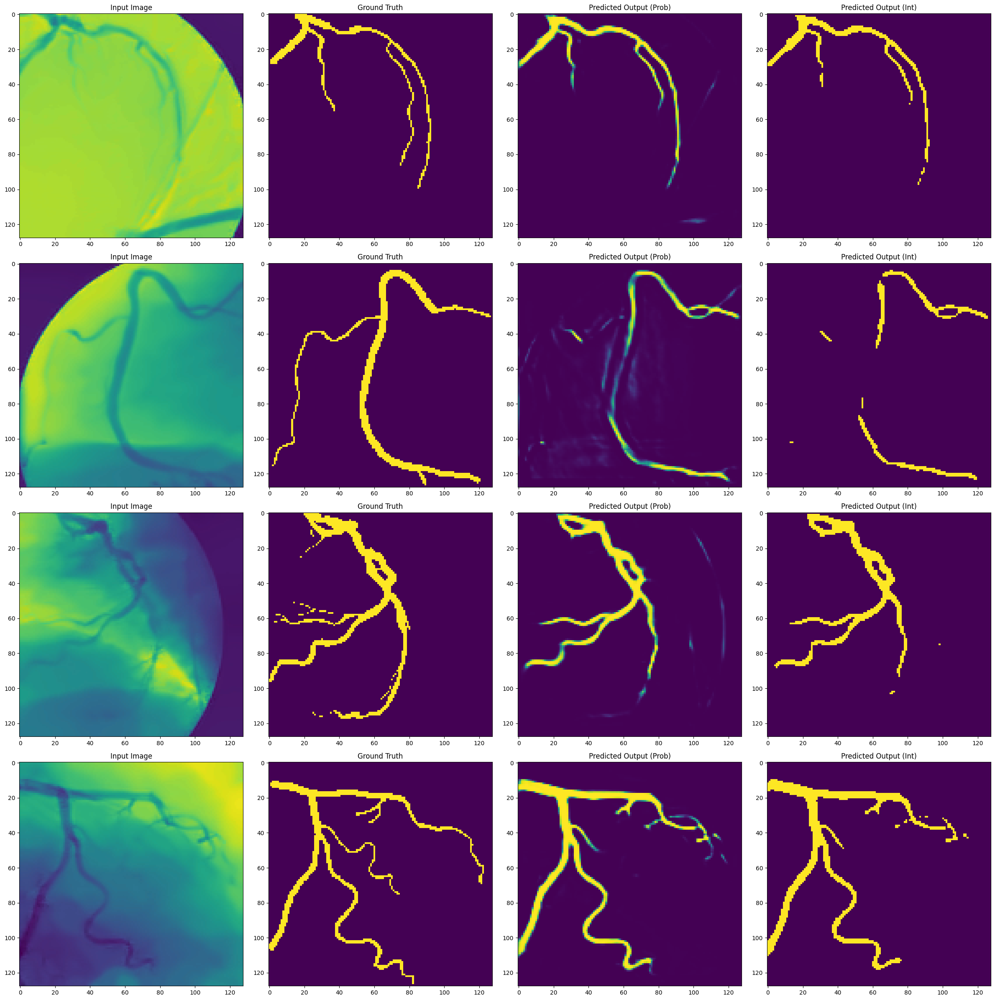

In [ ]:
train_id=10
# Get the predicted output for the train set
y_pred = model.predict(custom_gen_train[train_id][0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(custom_gen_train[train_id][0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(custom_gen_train[train_id][1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

1/1 [==============================] - 1s 612ms/step


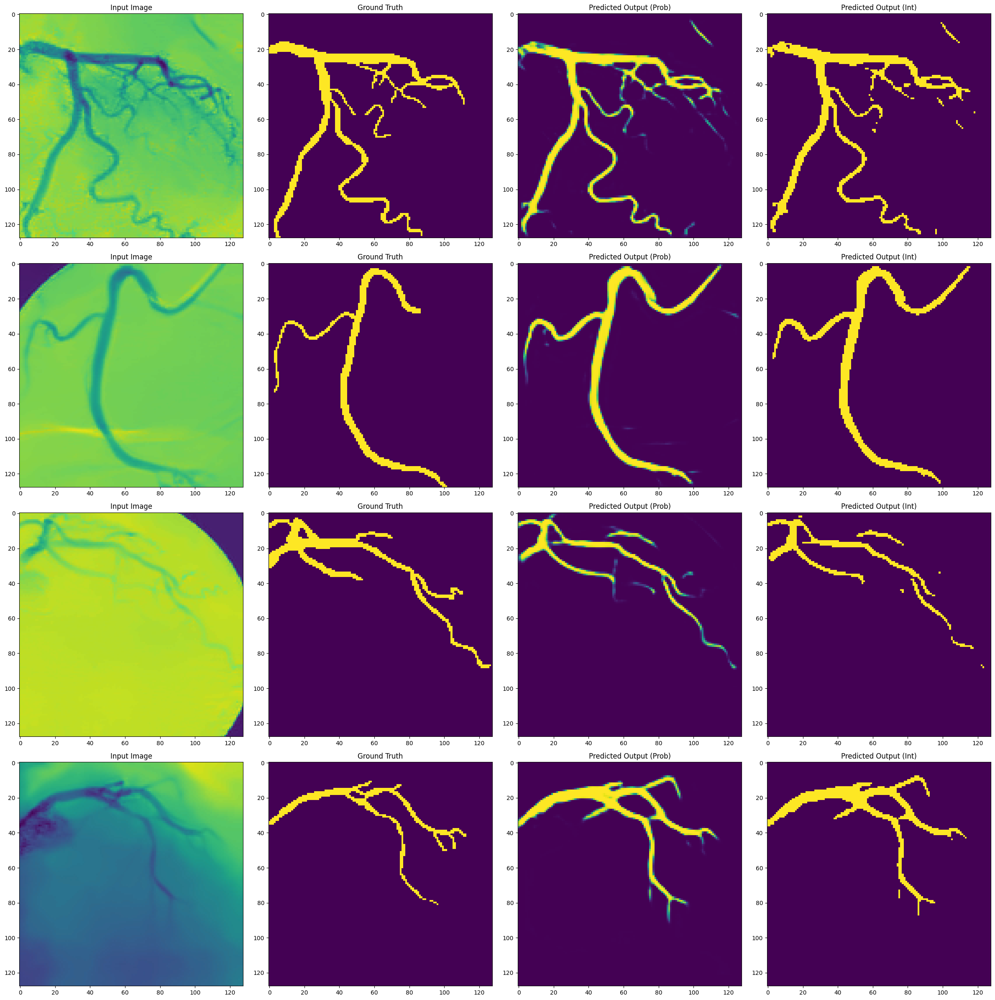

In [ ]:
test_id=3
# Get the predicted output for the test set
y_pred = model.predict(custom_gen_test[test_id][0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(custom_gen_test[test_id][0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(custom_gen_test[test_id][1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

## Draft

In [ ]:
batch_size= 8
custom_gen_train= CustomDataGenerator(train_df, batch_size= batch_size, resolution=128, img_dir= train_imgs_path, tg_dir= train_imgs_gt_path, preprocessing=None, denoising= False)
custom_gen_test= CustomDataGenerator(test_df, batch_size= batch_size, resolution=128, img_dir= test_imgs_path, tg_dir= test_imgs_gt_path, preprocessing=None, denoising= False)

Found 600 validated image filenames.
Found 600 validated image filenames.
Found 200 validated image filenames.
Found 200 validated image filenames.


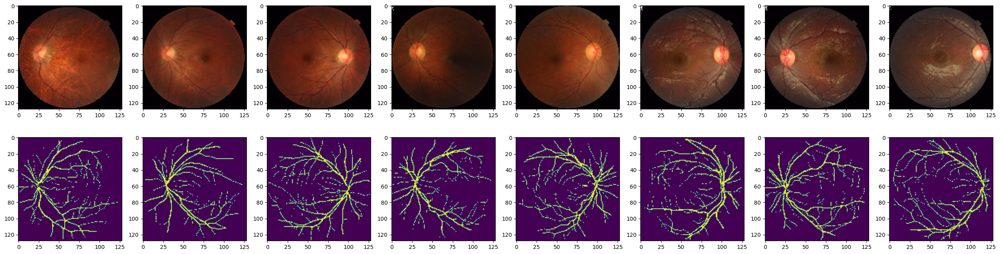

In [ ]:
sample_img, sample_tg= custom_gen_test.__getitem__(11)

fig, ax= plt.subplots(2, batch_size, figsize=(batch_size*4, 8))
for i in range(batch_size):
    ax[0,i].imshow(sample_img[i])
    ax[1,i].imshow(sample_tg[i])

ref_imgs= sample_img.copy()
ref_tgs= sample_tg.copy()

In [ ]:
class ImagePlotCallback(tf.keras.callbacks.Callback):
    def __init__(self, model, images, tgs, save_path):
        super(ImagePlotCallback, self).__init__()
        self.model = model
        self.images = images
        self.tgs= tgs
        self.save_path = save_path

    def on_epoch_end(self, epoch, logs=None):
        # Run the model on the images
        predictions = self.model.predict(self.images)

        fig, ax = plt.subplots(4, 8, figsize=(24, 12))
        for i in range(8):
            ax[0, i].imshow(self.images[i])
            #ax[i, 0].set_title('Input Image')
            ax[0, i].axis('off')
            ax[1, i].imshow(self.tgs[i].squeeze())
            #ax[i, 1].set_title('Ground Truth')
            ax[1, i].axis('off')
            ax[2, i].imshow(predictions[i].squeeze())
            #ax[i, 2].set_title('Predicted Output (Prob)')
            ax[2, i].axis('off')
            ax[3, i].imshow(predictions[i].squeeze().round())
            #ax[i, 3].set_title('Predicted Output (Int)')
            ax[3, i].axis('off')
        #ax.set_axis_off()
        plt.tight_layout()
        plt.savefig(f"{self.save_path}batch_epoch_{epoch}.png")
        plt.close(fig)

        fig, ax = plt.subplots(2, 4, figsize=(24, 12))
        for i in range(8):
            ax[i//4, i%4].imshow(predictions[i].squeeze())
            ax[i//4, i%4].axis('off')
        #ax.set_axis_off()
        # Save the plot
        plt.tight_layout()
        plt.savefig(f"{self.save_path}pred_epoch_{epoch}.png")
        plt.close(fig)

folder_path = "/content/ref_imgs_2/"

# Create the folder if it doesn't exist
if not os.path.exists(folder_path):
      os.makedirs(folder_path)

In [ ]:
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [ ]:
import segmentation_models as sm
import tensorflow as tf

BACKBONE = 'efficientnetb3'
preprocess_input = sm.get_preprocessing(BACKBONE)

model = sm.Unet(BACKBONE, classes=1,  activation='sigmoid')

total_loss = sm.losses.binary_focal_dice_loss

metrics = [sm.metrics.IOUScore(), sm.metrics.FScore()]

# Create an instance of the ImagePlotCallback
image_plot_callback = ImagePlotCallback(model, ref_imgs, ref_tgs, folder_path)

model.compile('Adam', total_loss, metrics)

history = model.fit(custom_gen_train,
                    validation_data= custom_gen_test,
                    epochs=15,
                    validation_steps= len(custom_gen_test),
                    #validation_steps= 3,
                    steps_per_epoch= len(custom_gen_train),
                    #steps_per_epoch= 5,
                    callbacks=[image_plot_callback])

Epoch 1/15
75/75 [==============================] - 356s 4s/step - loss: 0.5775 - iou_score: 0.3085 - f1-score: 0.4571 - val_loss: 1.0326 - val_iou_score: 0.1226 - val_f1-score: 0.2179
Epoch 2/15
75/75 [==============================] - 161s 2s/step - loss: 0.3310 - iou_score: 0.5358 - f1-score: 0.6969 - val_loss: 0.6343 - val_iou_score: 0.2745 - val_f1-score: 0.4299
Epoch 3/15
75/75 [==============================] - 159s 2s/step - loss: 0.2845 - iou_score: 0.5933 - f1-score: 0.7444 - val_loss: 0.4844 - val_iou_score: 0.4027 - val_f1-score: 0.5731
Epoch 4/15
75/75 [==============================] - 156s 2s/step - loss: 0.2635 - iou_score: 0.6206 - f1-score: 0.7655 - val_loss: 0.3857 - val_iou_score: 0.4881 - val_f1-score: 0.6553
Epoch 5/15
75/75 [==============================] - 161s 2s/step - loss: 0.2486 - iou_score: 0.6404 - f1-score: 0.7805 - val_loss: 0.3401 - val_iou_score: 0.5367 - val_f1-score: 0.6979
Epoch 6/15
75/75 [==============================] - 160s 2s/step - loss: 0.

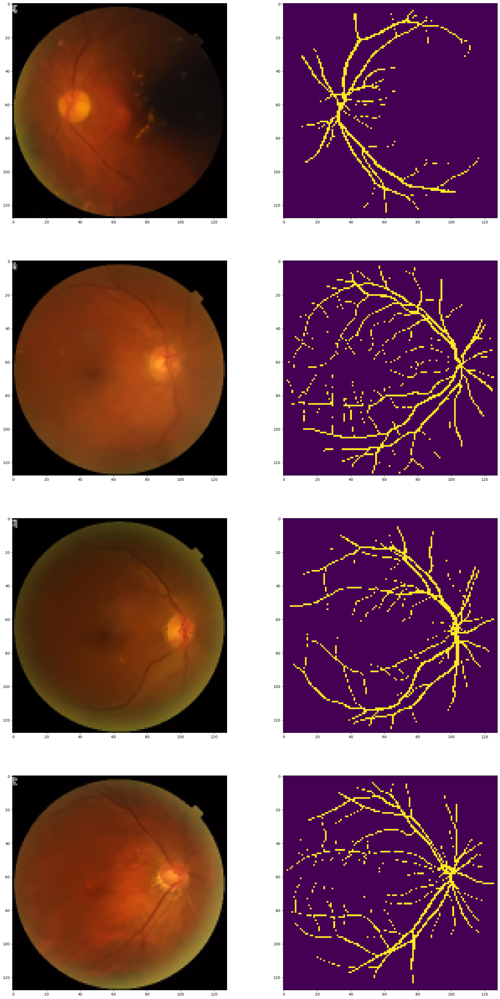

In [ ]:
# rescale denoise rescale
sample_img, sample_tg= custom_gen_train.__getitem__(10)

fig, ax= plt.subplots(4, 2, figsize=(24, 24*2))
for i in range(4):
    ax[i, 0].imshow(sample_img[i])
    ax[i, 1].imshow(sample_tg[i])

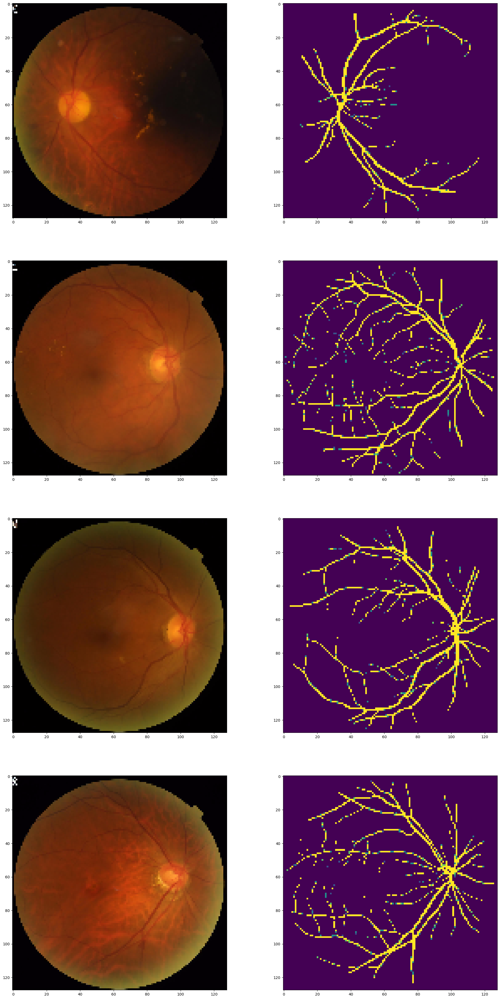

In [ ]:
# denoise rescale
sample_img, sample_tg= custom_gen_train.__getitem__(10)

fig, ax= plt.subplots(4, 2, figsize=(24, 24*2))
for i in range(4):
    ax[i, 0].imshow(sample_img[i])
    ax[i, 1].imshow(sample_tg[i])

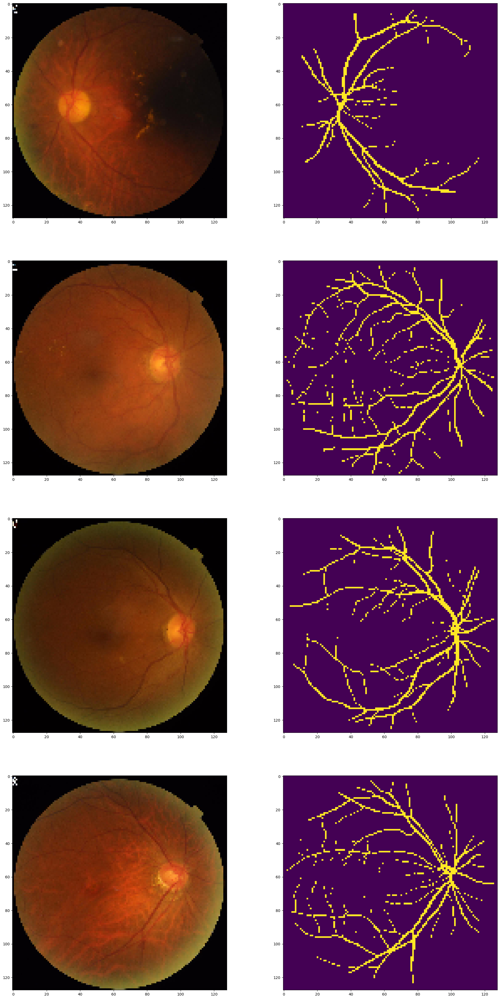

In [ ]:
# nothing
sample_img, sample_tg= custom_gen_train.__getitem__(10)

fig, ax= plt.subplots(4, 2, figsize=(24, 24*2))
for i in range(4):
    ax[i, 0].imshow(sample_img[i])
    ax[i, 1].imshow(sample_tg[i])

In [ ]:
import tensorflow as tf
class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, dataframe, batch_size=32, shuffle=True, augment=False):
        #self.img_dir = img_dir
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.dataframe = dataframe
        self.augment = augment

    def __len__(self):
        #return len(self.generator)
        return (len(self.dataframe)-1) // self.batch_size
    def on_epoch_end(self):
        #self.generator.on_epoch_end()
        self.dataframe = self.dataframe.sample(frac=1).reset_index(drop=True)

    def __getitem__(self, index):
        #return self.generator[idx]
        X= []
        y= []
        for ba in range(self.batch_size):
            img_name=  self.dataframe['img_fp'][self.batch_size * index + ba]
            img= plt.imread(img_name)
            img= cv2.resize(img, (256, 256))
            X.append(img)

            tg_name= self.dataframe['gt_fp'][self.batch_size * index + ba]
            tg= plt.imread(tg_name)
            tg= cv2.resize(tg, (256, 256))
            y.append(tg)

        X= np.array(X, dtype=np.float32)
        #X= np.divide(X, 255.)
        y= np.array(y, dtype=np.float32)

        return X, y